In [13]:
##########################################################
# Galario, emcee, uvplot を用いて、visibility fit を行う。
##########################################################
# まずは、uvplot で CASA の visibility data をテキストデータに落とす。
# https://uvplot.readthedocs.io/en/latest/index.html をきちんと読め！！
#
# インストールは pip install uvplot
# CASA 内にも uvplot をインストールする必要がある。
# CASA<1>: pip install uvplot
#
# ALMA のvisibility データをテキストデータに落とす方法
# CASA <2>: from uvplot import export_uvtable
# CASA <3>: export_uvtable("uvtable.txt", tb, vis='mstable.ms')
#
# CASA split command with keepflags=False をやっておいて、
# 使えるvisibility だけにあらかじめしておく。
# さらに各spectral window のchannel を split で平均して、
# すべて1channel にしておく。この際、分子輝線のあるチャンネルをフラッグする。
# その他、詳細は https://uvplot.readthedocs.io/en/latest/io.html
# ここでは uvtable.txt として既に visibility のテキストデータがある場合とする。
# uvtable.txt のフォーマットは
#
# Extracted from mstable.ms.
# wavelength[m] = 0.00132940778422
# Columns:  u[m]    v[m]    Re(V)[Jy]       Im(V)[Jy]       weight
# -2.063619e+02       2.927104e+02    -1.453431e-02   -1.590934e-02   2.326950e+04
# 3.607948e+02        6.620900e+01    -1.680727e-02   1.124862e-02    3.624442e+04
# 5.752178e+02        -6.299933e+02   5.710317e-03    6.592049e-03    4.719500e+04
#
# 3種類のフォーマットが用意されている。今回は COLUMNS_V0
# FORMAT          COLUMNS                                                 COLUMNS_LINE (copy-paste as 2nd line in the ASCII file)
# COLUMNS_V0      ['u', 'v', 'Re', 'Im', 'weights']                       '# Columns      u v Re Im weights'
# COLUMNS_V1      ['u', 'v', 'Re', 'Im', 'weights', 'freqs', 'spws']      '# Columns      u v Re Im weights freqs spws'
# COLUMNS_V2      ['u', 'v', 'V', 'weights', 'freqs', 'spws']             '# Columns      u v V weights freqs spws'
#
#
# Galario については
# https://mtazzari.github.io/galario/quickstart.html を読め！！
# %cd /Users/takakuwa/Desktop/IRAS04169/GALARIO
%cd /Users/takakuwa/Desktop/eDisk/galario
# Working directory に移動する。

import sys
sys.path.append('/Users/takakuwa/opt/anaconda3/envs/galario3/lib/python38.zip')
sys.path.append('/Users/takakuwa/opt/anaconda3/envs/galario3/lib/python3.8')
sys.path.append('/Users/takakuwa/opt/anaconda3/envs/galario3/lib/python3.8/lib-dynload')
sys.path.append('/Users/takakuwa/opt/anaconda3/envs/galario3/lib/python3.8/site-packages')
sys.path.append('/Users/takakuwa/opt/anaconda3/envs/galario3/lib/python3.8/site-packages/aeosa')
sys.path.append('/Users/takakuwa/opt/anaconda3/envs/galario3/lib/python3.8/site-packages/locket-0.2.1-py3.8.egg')
sys.path.append('/usr/local/lib/python3.9/site-packages')

# 必要なモジュールは、最初にここで全部 import する。
%matplotlib inline
import numpy as np
import math
import subprocess as com
import sys
# sys.path.append('/usr/local/lib/python3.6/site-packages')
# sys.path.append('/home/takakuwa/anaconda3')
import pprint
import emcee
from emcee import EnsembleSampler
import corner
import matplotlib.pyplot as plt
import pandas as pd
import time
from galario import deg, arcsec
from galario.double import get_image_size
from galario.double import chi2Profile
from galario.double import sampleProfile
from uvplot import UVTable, arcsec
from uvplot import COLUMNS_V0 

pd.options.display.precision = 20
sys.path

# 観測の波長 (m) を指定する。上記の uvtable のフォーマット見よ。
# wle = 1.e-3  # observing wavelength in meter
# wle = 1.28116435e-3
wle = 1.3277959379297596e-3


# テキストデータに落とした visibility data 読み込む。COLUMNS_V0 のフォーマット。
# ここでテキストデータのファイル名を指定する。
# Read the text file of the visibility
# (Note the data should be C-contiguous, so np.require is necessary.)
u, v, Re, Im, w = np.require(np.loadtxt("uvtable2.txt", unpack=True), requirements='C')
u /= wle     # unit conversion from m to lambda
v /= wle     # uv の単位を m から 波長単位とする。

# Determine the optimal image size
# Galario の get_image_size をつかって、データの uv の範囲から、
# 画像の適切なピクセルサイズ、ピクセル数を計算する。--> 後で使う。
nxy, dxy = get_image_size(u, v, verbose=True)

/Users/takakuwa/Desktop/eDisk/galario
dxy:5.687636e-02arcsec	nxy_MRS:1024
nxy_MRS: matrix size to have FOV > f_min * MRS, where f_min:5.0 and MRS:1.164828e+01arcsec


In [14]:
# このセルはいじらなくていい。
#
# MCMC の進行の時間計測の function
def make_string(result_time):
    ms,hms=math.modf(result_time)
    sec2day=hms/86400
    day=math.floor(sec2day)
    sec2hour=(sec2day-day)*24
    hour=math.floor(sec2hour)
    sec2minu=(sec2hour-hour)*60
    minu=math.floor(sec2minu)
    sec2sec=(sec2minu-minu)*60
    sec=round(sec2sec)
    return day,hour,minu,sec

# いわゆる prior probability function として、パラメータの可能な範囲を決める。
# p は実は walker 分 かかっている？---> かかっていない！！
def lnpriorfn(p, par_ranges):
    """ Uniform prior probability function """

    for i in range(len(p)):
        if p[i] < par_ranges[i][0] or p[i] > par_ranges[i][1]:
            return -np.inf   # パラメータが範囲を超えたら、無限大を返す。これにより、パラメータを探す範囲を限定。

    jacob = -p[0]       # jacobian of the log transformation

    return jacob


In [15]:
# fit したい空間構造の関数をここで指定する。
# 軸対称構造の場合は単純な1次元関数でかけることになる。incl, P.A. はfitting parameters となる。
# 今回は Gaussian、しかし (tapered) power-law, ring, gap, disk など、なんでもできるはず。
# それに伴って fitting parameters も変わってくるので、以下、posterior の部分も含めて、
# このセルは改訂が必要となる。

#def GaussianProfile(f0, sigma, Rmin, dR, nR):
#    """ Gaussian brightness profile. """

    # radial grid
#    R = np.linspace(Rmin, Rmin + dR*nR, nR, endpoint=False)
    # f0 is in Jy/str, sigma, Rmin, dR in arcsec.
#    return f0 * np.exp(-0.5*(R/sigma)**2.)

#def RingProfile(f0, sigma, R0, Rmin, dR, nR):
#    """ Gaussian Ring brightness profile. """

    # radial grid
#    R = np.linspace(Rmin, Rmin + dR*nR, nR, endpoint=False)
    # f0 is in Jy/str, sigma, Rmin, dR in arcsec.
#    return f0 * np.exp(-0.5*(R-R0/sigma)**2.)

# def RingProfile(f1, sigma1, R1, Rmin, dR, nR):
    # radial grid
#    R = np.linspace(Rmin, Rmin + dR*nR, nR, endpoint=False)
#    f=np.zeros((R.shape))
#    where_disk = np.where((R <= R1+sigma1/2.) & (R > R1-sigma1/2.))
#    if len(where_disk[0]):
#        f[where_disk] = f1
#    else:
#        f = 0.
#
#    return f


def GapProfile(f0,f1,sigma0,sigma1,R1,Rmin, dR, nR):
    R = np.linspace(Rmin, Rmin + dR*nR, nR, endpoint=False)
    f=np.zeros((R.shape))
    where_disk = np.where((R <= R1+sigma1/2.) & (R > R1-sigma1/2.))
    where_star = np.where((R <= sigma0/2.))
    if len(where_disk[0]):
        f[where_disk] = f1
    if len(where_star[0]):
        f[where_star] = f0
    
    return f


# いわゆる posterior (実際は単にchi^2) を galario のモジュールで計算する。
# 軸対称関数の場合は chi2Profile を使う。非軸対称の一般のイメージの場合は chi2Imageが使える。
def lnpostfn(p, p_ranges, Rmin, dR, nR, nxy, dxy, u, v, Re, Im, w):
    """ Log of posterior probability function """

    lnprior = lnpriorfn(p, p_ranges)  # apply prior
    if not np.isfinite(lnprior):      # パラメータがサーチ範囲を超えたら、無限大を返す。
        return -np.inf

    # unpack the parameters
    # 入ってきた、ひとつのパラメータセット。一次元ガウシアンだと以下の6つのパラメータとなる。
    # このパラメータセットに対する chi^2, posterior を計算することになる。
    f0, f1, sigma0, sigma1, R1, inc, PA, dRA, dDec = p

    f0 = 10.**f0        # convert from log to real space
    f1 = 10.**f1
                        # サーチする f0 としては log(f0) となっている。

    # convert to radians (Galario はラジアンを使うらしい。)
    sigma0 *= arcsec     # サーチするパラメータの単位は arcsec, deg
    sigma1 *= arcsec
    R1 *= arcsec
    Rmin *= arcsec
    dR *= arcsec
    inc *= deg
    PA *= deg
    dRA *= arcsec
    dDec *= arcsec

    # compute the model brightness profile
    f = GapProfile(f0, f1, sigma0, sigma1, R1, Rmin, dR, nR)   # --> 空間構造の1次元リングが返ってくる。

    # サーチするパラメータから作った1次元空間構造、他のサーチパラメータである inc, PA, dRA, dDec,
    # その他固定パラメータ、及び visibility data から、visibility 空間で chi^2 を計算する。
    # 非軸対称の一般のイメージの場合は chi2Imageが使える。
    chi2 = chi2Profile(f, Rmin, dR, nxy, dxy, u, v, Re, Im, w,
                       inc=inc, PA=PA, dRA=dRA, dDec=dDec)      # --> ここで incl, pa がはいる。
    
    # 以下、途中経過を書き出すようにしておく。でないと何が起こっているのか全くわからない。
    end_time = time.time()  # The present time
    result_time = end_time - start_time
    day,hour,minu,sec = make_string(result_time)
    global iterl
    global counter
    print(("%15.8f , %0.3f,  %0.3f,  %0.3f,  %0.3f, %0.3f , %0.3f , %0.3f ,   %0.3f ,     %0.3f ,      %02dd%02dh%02dm%02ds , %4d/%4d")\
          %(chi2,     np.log10(f0), np.log10(f1), sigma0/arcsec, sigma1/arcsec,  R1/arcsec, inc/deg, PA/deg,  dRA/arcsec, dDec/arcsec,  day,hour,minu,sec,counter,iterl))
    counter+=1
        
    return -0.5 * chi2 + lnprior

In [16]:
# 実際の MCMC の部分
# このセルでMCMC のwalker や、空間グリッド、
# フィティングパラメータの初期値、範囲を指定。
#
# In our fit we will have 6 free parameters:
# on top of the model parameters f0 and sigma we want to fit
# the inclination inc, the position angle PA, and the angular offsets
# (ΔRA,ΔDec) with respect to the phase center.

# 半径方向のグリッド数、分解能を指定。
# radial grid parameters
Rmin = 1e-3  # arcsec
#dR = 0.01    # arcsec
dR = 0.001
nR = 10000


# パラメータの値の初期値
# ガウシアンのピーク log f0 (Jy / str), 半値幅sigma (arcsec), inclination (deg), P.A. (deg), dRA, dDEC (arcsec)
#p0 = [10, 0.5, 70., 60., 0., 0.] #  2 parameters for the model + 4 (inc, PA, dRA, dDec)
p0 = [9.7, 9.7, 0.05, 0.05, 0.2, 60., 100., 0., -0.6] #  2 parameters for the model + 4 (inc, PA, dRA, dDec)


# 可能なパラメータの値の範囲。
# parameter space domain
# observed peak ~3 mJy / 0.3 arcsec^2 --> 0.003 Jy x 42547680000 / 0.09 = 1418256000 ~10^9
# 1 [sr] = 3283 [deg2] = 3283 x 3600 x 3600 = 42547680000 arc^2
p_ranges = [[8.5, 11.0],
            [8.5, 11.0],
            [0.01, 0.50],
            [0.01, 0.50],
            [0.01, 0.70],
            [40., 75.],
            [90., 140.],
            [-1., 1.],
            [-2., 0.]]

ndim = len(p_ranges)   # number of dimensions
nwalkers = 40          # number of walkers
# nwalkers = 10
nthreads = 4           # CPU threads that emcee should use
                       # ---> 実際に効いているのかどうか不明。。。。
nsteps = 3000          # total number of MCMC steps
# nskip=nsteps//10       # バーンイン% --> 後からautocorrelation の解析により見積もることもできる。
nskip=1000
iterl = (nsteps+1)*nwalkers  # 反復回数
counter = 0            # カウンター

# Sampler の設定
# lnpostfn(p, p_ranges, Rmin, dR, nR, nxy, dxy, u, v, Re, Im, w):
sampler = EnsembleSampler(nwalkers, ndim, lnpostfn,
                          args=[p_ranges, Rmin, dR, nR, nxy, dxy, u, v, Re, Im, w],
                          threads=nthreads)
# p_ranges is a rectangular domain in the parameter space that defines the search region;
# lnpostfn is the posterior probability function;
# args defines an array of fixed parameters that lnpostfn takes additionally in input.

# initialize the walkers with an ndim-dimensional Gaussian ball
pos = [p0 + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]

# execute the MCMC
start_time = time.time()
print("    chi2,          f0, f1, sigma0 (arcsec), sigma1 (arcsec), R1 (arcsec), inc (deg),PA (deg),dRA (arcsec),dDec (arcsec), 経過時間    ,     反復回数")
# pos, prob, state = sampler.run_mcmc(pos, nsteps, rstate0=state, lnprob0=prob)
pos, prob, state = sampler.run_mcmc(pos, nsteps)
samples = sampler.chain[:, nskip:, :].reshape((-1, ndim))
# samples = sampler.chain[:, -1000:, :].reshape((-1, ndim))
best = sampler.flatchain[sampler.flatlnprobability.argmax()]

end_time1 = time.time()
# result_time1 = end_time1 - start_time1
result_time1 = end_time1 - start_time
day1,hour1,minu1,sec1 = make_string(result_time1)
print("\n合計処理時間 %d日%d時間%d分%d秒\n"%(day1,hour1,minu1,sec1))

print("ベストパラメータ")
print("f0=%0.3f, f1=%0.3f, sigma0=%0.3f (arcsec), sigma1=%0.3f (arcsec), R1=%0.3f (arcsec), inc=%0.3f (deg), PA=%0.3f (deg), dRA=%0.3f (arcsec), dDec=%0.3f (arcsec) \n"\
      %(best[0],best[1],best[2],best[3],best[4],best[5],best[6],best[7],best[8]))



    chi2,          f0, f1, sigma0 (arcsec), sigma1 (arcsec), R1 (arcsec), inc (deg),PA (deg),dRA (arcsec),dDec (arcsec), 経過時間    ,     反復回数
8220982.98862633 , 9.700,  9.700,  0.050,  0.050, 0.200 , 60.000 , 100.000 ,   -0.000 ,     -0.600 ,      00d00h00m00s ,    0/120040
8220984.50007725 , 9.700,  9.700,  0.050,  0.050, 0.200 , 60.000 , 100.000 ,   0.000 ,     -0.600 ,      00d00h00m00s ,    1/120040
8219978.67843214 , 9.700,  9.700,  0.050,  0.050, 0.200 , 60.000 , 100.000 ,   0.000 ,     -0.600 ,      00d00h00m00s ,    2/120040
8219974.01020865 , 9.700,  9.700,  0.050,  0.050, 0.200 , 60.000 , 100.000 ,   -0.000 ,     -0.600 ,      00d00h00m00s ,    3/120040
8219963.58930113 , 9.700,  9.700,  0.050,  0.050, 0.200 , 60.000 , 100.000 ,   0.000 ,     -0.600 ,      00d00h00m00s ,    4/120040
8221015.19424184 , 9.700,  9.700,  0.050,  0.050, 0.200 , 60.000 , 100.000 ,   0.000 ,     -0.600 ,      00d00h00m00s ,    5/120040
8221004.36335440 , 9.700,  9.700,  0.050,  0.050, 0.200 , 60.000 ,

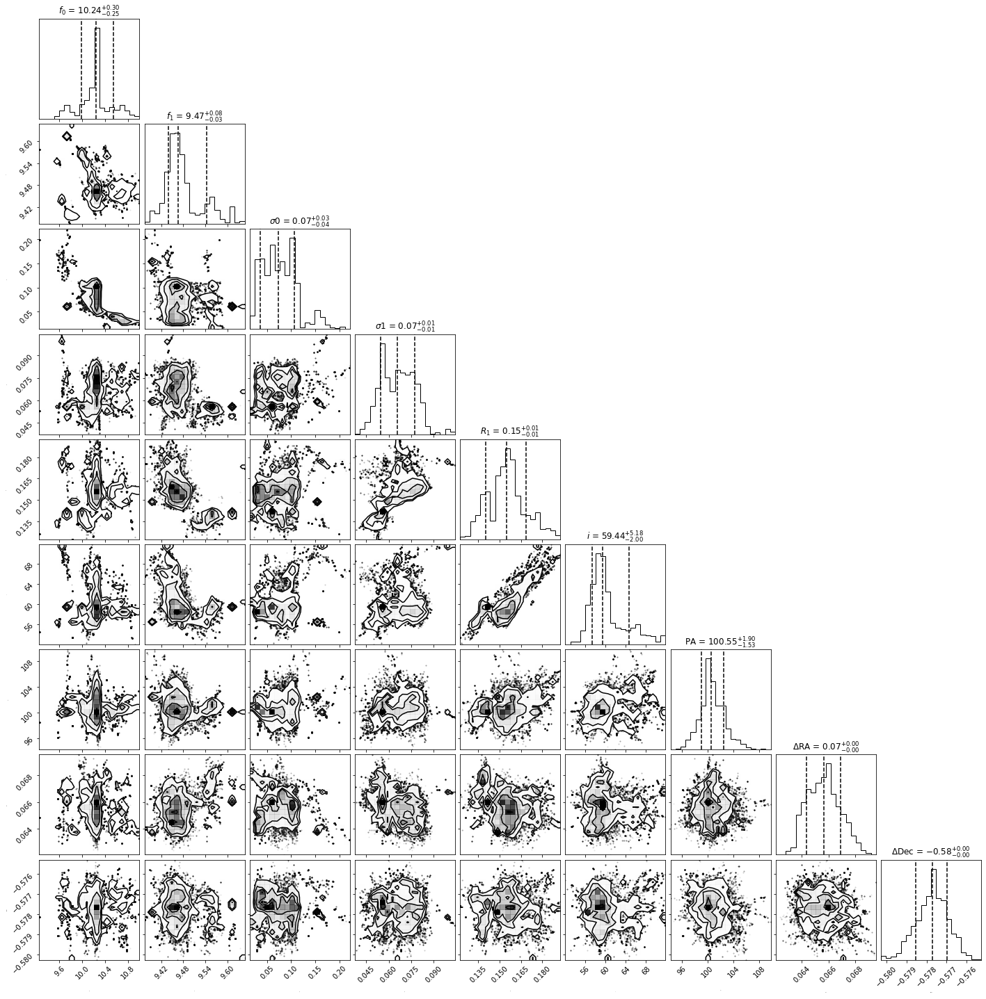

In [17]:
# よく見る corner plot を作る。以下、パラメータによって labels は変える。
# あとは変えなくてよい（？ ほとんどおまじない）

# do the corner plot
# samples = sampler.chain[:, -1000:, :].reshape((-1, ndim))
fig = corner.corner(samples, labels=["$f_0$", "$f_1$", "$\sigma0$", "$\sigma1$", "$R_1$", r"$i$", r"PA", r"$\Delta$RA", r"$\Delta$Dec"],
                    show_titles=True, quantiles=[0.16, 0.50, 0.84],
                    label_kwargs={'labelpad':20, 'fontsize':0}, fontsize=8)
fig.savefig("triangle_example.png")


Reading uvtable from uvtable2.txt ...
Assuming column format: ['u', 'v', 'Re', 'Im', 'weights']
Reading uvtable from uvtable2.txt ...done
Masking 3 uv bins
Masking 3 uv bins


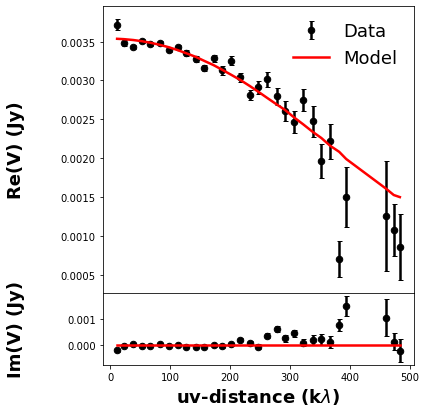

In [18]:
# 最後に uvplot
#
# do the uv-plot
# select the bestfit model (here, e.g., the model with median parameters)
bestfit = [np.percentile(samples[:, i], 50) for i in range(ndim)]

f0, f1, sigma0, sigma1, R1, inc, PA, dRA, dDec = bestfit

f0 = 10.**f0        # convert from log to real space
f1= 10.**f1        # convert from log to real space


# convert to radians (uvplot を使うため。)
sigma0 *= arcsec
sigma1 *= arcsec
R1 *= arcsec
Rmin *= arcsec
dR *= arcsec
inc *= deg
PA *= deg
dRA *= arcsec
dDec *= arcsec

f = GapProfile(f0, f1, sigma0, sigma1, R1, Rmin, dR, nR)
# best fit の1次元空間プロファイルから、model visibility を作る。
# compute the visibilities of the bestfit model
vis_mod = sampleProfile(f, Rmin, dR, nxy, dxy, u, v,
                                 inc=inc, PA=PA, dRA=dRA, dDec=dDec)


uvbin_size = 15e3     # uv-distance bin, units: wle
# observations uv-plot
uv = UVTable(filename='uvtable2.txt', wle=wle, columns=COLUMNS_V0)
uv.apply_phase(-dRA, -dDec)
uv.deproject(inc, PA)

uv_mod = UVTable(uvtable=[u*wle, v*wle, vis_mod.real, vis_mod.imag, w], wle=wle, columns=COLUMNS_V0)
uv_mod.apply_phase(dRA=-dRA, dDec=-dDec)
uv_mod.deproject(inc=inc, PA=PA)

axes = uv.plot(linestyle='.', color='k', label='Data', uvbin_size=uvbin_size)
uv_mod.plot(axes=axes, linestyle='-', color='r', label='Model', yerr=False, uvbin_size=uvbin_size)
axes[0].figure.savefig("uvplot_example.pdf")


In [23]:
dDec

-2.8018011267402798e-06

In [20]:
uv_mod

In [24]:
f

array([4.94205477e+09, 4.94205477e+09, 4.94205477e+09, ...,
       4.94205419e+09, 4.94205419e+09, 4.94205419e+09])